In [248]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import time
from scipy.stats import norm,kstest,shapiro,t
import warnings
import seaborn as sns
import statistics
warnings.filterwarnings('ignore')
import yfinance as yf



In [19]:
intc_df = yf.download(['TSM220304C00115000'], 
                      start='2022-01-05', 
                      end='2022-02-11', 
                      progress=False,
)
intc_df

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2022-02-02,10.15,10.54,10.05,10.54,10.54,6
2022-02-03,10.05,10.05,10.05,10.05,10.05,0
2022-02-04,8.40,8.40,8.40,8.40,8.40,1
2022-02-07,10.55,10.55,9.90,9.90,9.90,6
2022-02-10,12.30,13.30,11.32,11.32,11.32,15
2022-02-11,9.08,9.08,9.08,9.08,9.08,5


In [20]:
intc_df['Adj Close']

Date
2022-02-02    10.54
2022-02-03    10.05
2022-02-04     8.40
2022-02-07     9.90
2022-02-10    11.32
2022-02-11     9.08
Name: Adj Close, dtype: float64

In [55]:
us_stock = pd.read_csv("nasdaq_screener.csv")
us_stock.dropna(subset = ["Sector"],inplace=True)
us_stock = us_stock[['Symbol','Name','Sector','Industry']]
stock_symbol = list(us_stock['Symbol'])


In [60]:
for sector, sector_data in us_stock.groupby('Sector'):
    print(sector)

Basic Industries
Capital Goods
Consumer Durables
Consumer Non-Durables
Consumer Services
Energy
Finance
Health Care
Miscellaneous
Public Utilities
Technology
Transportation


In [249]:
#extracting data
minTick_data = pd.read_csv("stock_data_mintick2.csv")
minTick_data.set_index('date',inplace=True)
minTick_data.index = pd.to_datetime(minTick_data.index)
minTick_data.head()

,AAOI,AAPL,ABM,ACEV,ACEVU,ACIW,ACLS,ACMR,ACVA,ACY,...,AWRE,AYX,AZPN,BAND,BASE,BBAI,BBSI,BCOV,BDR,BEAT
date,,,,,,,,,,,,,,,,,,,,,
2020-02-27 09:30:00,9.895,70.8500,35.155,NaN,NaN,27.855,23.315,35.425,NaN,0.889,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-02-27 09:31:00,9.895,70.9025,35.140,NaN,NaN,26.620,23.200,35.615,NaN,0.889,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-02-27 09:32:00,9.720,70.7200,34.890,NaN,NaN,26.390,23.195,35.350,NaN,0.889,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-02-27 09:33:00,9.700,70.9513,34.890,NaN,NaN,26.650,22.980,35.500,NaN,0.889,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-02-27 09:34:00,9.715,70.6675,34.880,NaN,NaN,26.495,22.945,35.590,NaN,0.889,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [250]:
returns = minTick_data.pct_change()

<AxesSubplot:>

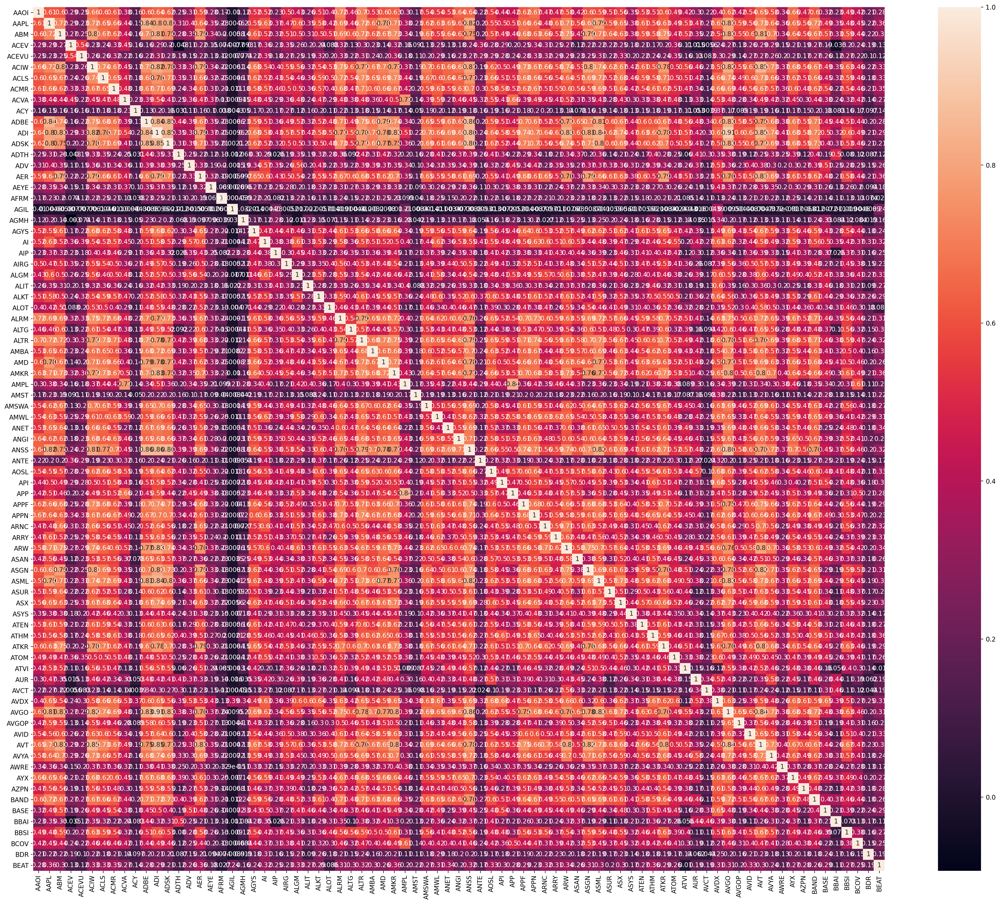

In [252]:

period = 60
volatility = returns.rolling(window=period).std()
figure(figsize=(30, 25), dpi=200)
sn.heatmap(volatility.corr(), annot = True)

In [288]:
period = 60
volatility = returns.rolling(window=period).std()
c = volatility.corr()
s = c.unstack()
so = s.sort_values(ascending = False,kind="quicksort")
so[79:90]

AVGO  ADI     0.906454
ADI   AVGO    0.906454
AVGO  ANSS    0.859849
ANSS  AVGO    0.859849
ADI   ANSS    0.858197
ANSS  ADI     0.858197
ADBE  ANSS    0.857824
ANSS  ADBE    0.857824
      ADSK    0.856784
ADSK  ANSS    0.856784
AVT   ACIW    0.848393
dtype: float64

In [289]:
period = 60
volatility = minTick_data.rolling(window=period).std()
c = volatility.corr()
s = c.unstack()
so = s.sort_values(ascending = False,kind="quicksort")
so[79:90]

AVGOP  AVGO     0.868536
AVGO   AVGOP    0.868536
ARW    AVT      0.808970
AVT    ARW      0.808970
ADI    AVGO     0.725976
AVGO   ADI      0.725976
ADI    ARW      0.714243
ARW    ADI      0.714243
ANSS   ADBE     0.678032
ADBE   ANSS     0.678032
AER    ARW      0.676648
dtype: float64

<Figure size 4000x3600 with 0 Axes>

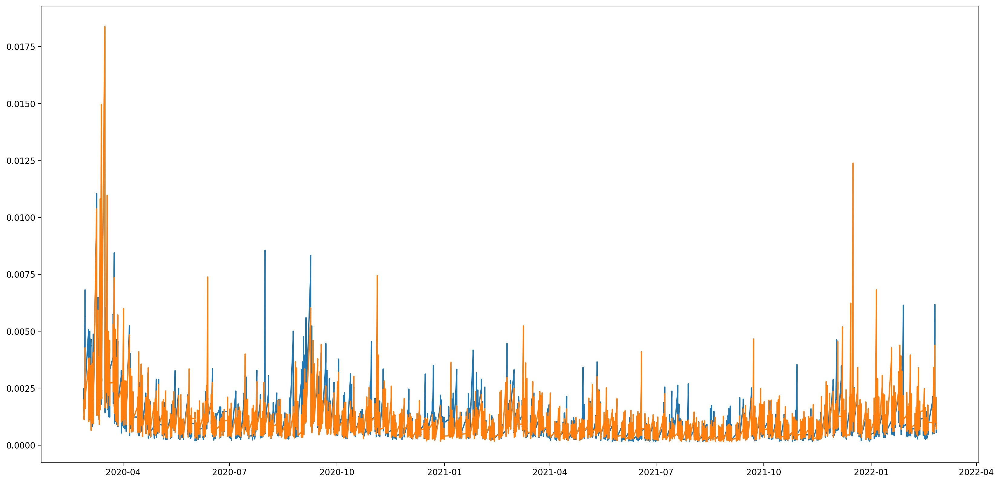

In [232]:
figure(figsize=(20, 18), dpi=200)

AAPL = volatility['AAPL'].dropna() # Apple
ADBE = volatility['ADBE'].dropna() # Adobe
figure(figsize=(20, 10), dpi=200)
plt.plot(AAPL, label = "AAPL")
plt.plot(ADBE, label = "ADBE")



Text(0.5, 1.0, 'Spread between NIKE and AAPL')

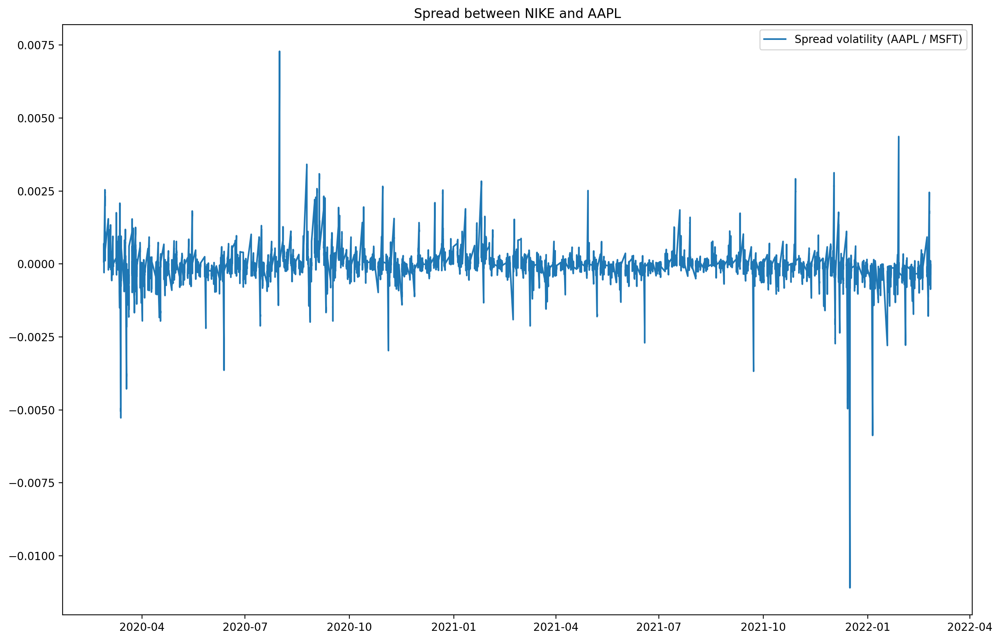

In [233]:
figure(figsize=(15, 10), dpi=200)
plt.plot(AAPL - ADBE, label = 'Spread volatility (AAPL / MSFT)')
plt.legend()
plt.title("Spread between NIKE and AAPL")

In [236]:
result = ts.coint(ALTR, ADI)
result

(-5.594273643242826,
 1.1546556210599054e-05,
 array([-3.89649576, -3.33616111, -3.04447159]))

In [238]:
# Cointegration test: A technique used to find a potential correlation in a time series (long term)
# Determines if the spread between the two assets are constant over time.
# Null Hypothesis: Spread between series are non-stationary.
# Uses the augmented Engle-Granger two-step cointegration test.
cointegration_t_statistic = result[0]
p_val = result[1]
critical_values_test_statistic_at_1_5_10 = result[2]
print('We want the P val < 0.05 (meaning that cointegration exists)')
print('P value for the augmented Engle-Granger two-step cointegration test is', p_val)


We want the P val < 0.05 (meaning that cointegration exists)
P value for the augmented Engle-Granger two-step cointegration test is 1.1546556210599054e-05


In [235]:
# Compute the ADF test for Altair Engineering and Microsoft
# With all time series, you want to have stationary data otherwise our data will be very hard to predict.
# ADF for Berkshire Hathaway Class B
AAPL_ADF = adfuller(AAPL)
print('P value for the Augmented Dickey-Fuller Test is', ALTR_ADF[1])
ADBE_ADF = adfuller(ADBE)
print('P value for the Augmented Dickey-Fuller Test is', ADBE_ADF[1])
Spread_ADF = adfuller(AAPL - ADBE)
print('P value for the Augmented Dickey-Fuller Test is', Spread_ADF[1])
Ratio_ADF = adfuller(AAPL / ADBE)
print('P value for the Augmented Dickey-Fuller Test is', Ratio_ADF[1])

P value for the Augmented Dickey-Fuller Test is 0.5584070046002765
P value for the Augmented Dickey-Fuller Test is 0.0
P value for the Augmented Dickey-Fuller Test is 0.0
P value for the Augmented Dickey-Fuller Test is 0.0


Text(0.5, 1.0, 'Vol Ratio between BRK and MSFT')

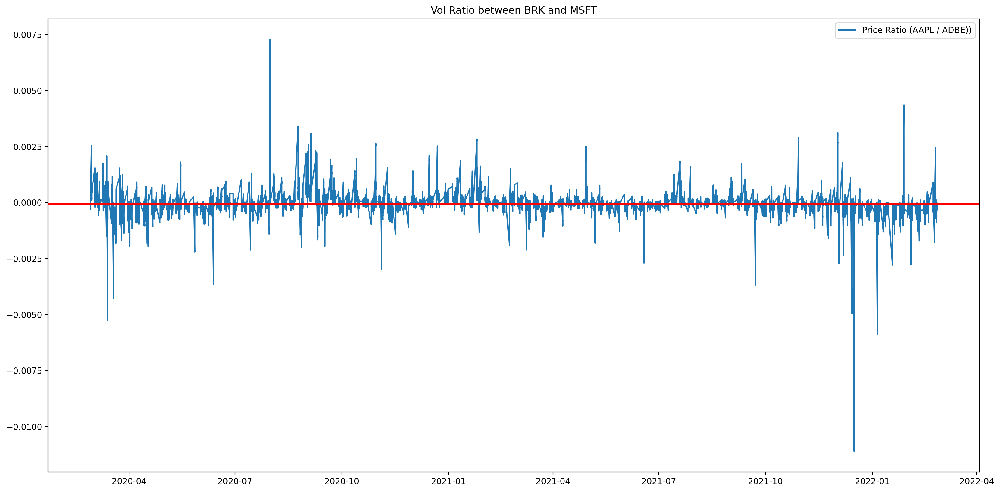

In [244]:
# Also, we can take a look at the price ratios between the two time series.
figure(figsize=(20, 10), dpi=200)
ratio = AAPL - ADBE
plt.plot(ratio, label = 'Price Ratio (AAPL / ADBE))')
plt.axhline(ratio.mean(), color='red')
plt.legend()
plt.title("Vol Ratio between BRK and MSFT")

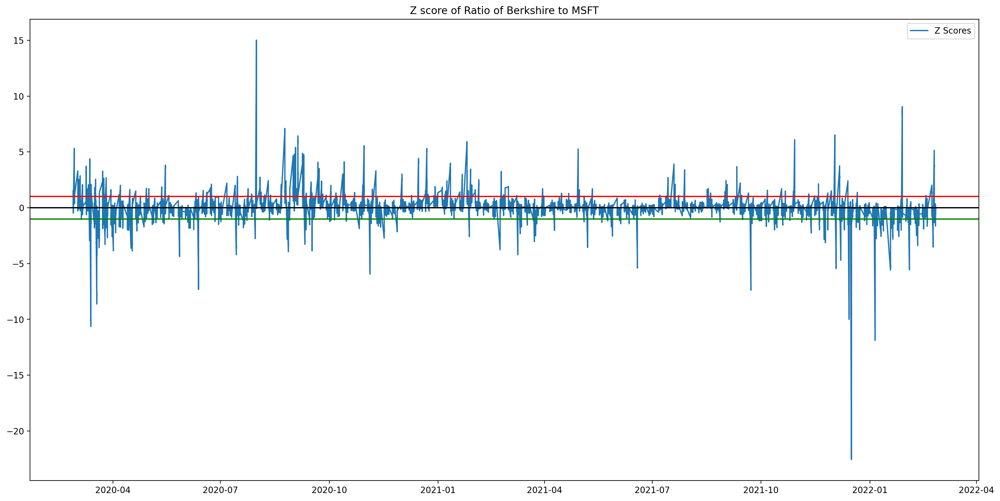

In [247]:
# NOTE, here you can either use the spread OR the Price ratio approach. Anyways, let's standardize the ratio so we can have a 
# upper and lower bound to help evaluate our trends.. Let's stick with the ratio data.
figure(figsize=(20, 10), dpi=200)
# Calculate the Zscores of each row.
df_zscore = (ratio - ratio.mean())/ratio.std()
plt.plot(df_zscore, label = "Z Scores")
plt.axhline(df_zscore.mean(), color = 'black')
#plt.axhline(1.0, color='red') # Setting the upper and lower bounds to be the z score of 1 and -1 (1/-1 standard deviation)
plt.axhline(1, color='red') # 95% of our data will lie between these bounds.
#plt.axhline(-1.0, color='green') # 68% of our data will lie between these bounds.
plt.axhline(-1, color='green') # 95% of our data will lie between these bounds.
plt.legend(loc = 'best')
plt.title('Z score of Ratio of Berkshire to MSFT')
plt.show()
# For the most part, the range that exists outside of these 'bands' must come converge back to the mean. Thus, you can 
# determine when you can go long or short the pair (BRK_B to MSFT).

In [276]:
minTick_data.head()

,AAOI,AAPL,ABM,ACEV,ACEVU,ACIW,ACLS,ACMR,ACVA,ACY,...,AWRE,AYX,AZPN,BAND,BASE,BBAI,BBSI,BCOV,BDR,BEAT
date,,,,,,,,,,,,,,,,,,,,,
2020-02-27 09:30:00,9.895,70.8500,35.155,NaN,NaN,27.855,23.315,35.425,NaN,0.889,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-02-27 09:31:00,9.895,70.9025,35.140,NaN,NaN,26.620,23.200,35.615,NaN,0.889,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-02-27 09:32:00,9.720,70.7200,34.890,NaN,NaN,26.390,23.195,35.350,NaN,0.889,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-02-27 09:33:00,9.700,70.9513,34.890,NaN,NaN,26.650,22.980,35.500,NaN,0.889,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-02-27 09:34:00,9.715,70.6675,34.880,NaN,NaN,26.495,22.945,35.590,NaN,0.889,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [277]:
returns = minTick_data.pct_change()
corr_matrix = minTick_data.corr()
corr_matrix

,AAOI,AAPL,ABM,ACEV,ACEVU,ACIW,ACLS,ACMR,ACVA,ACY,...,AWRE,AYX,AZPN,BAND,BASE,BBAI,BBSI,BCOV,BDR,BEAT
AAOI,1.000000,-0.495337,-0.306763,0.454515,0.235053,-0.130550,-0.664679,0.117478,0.720554,-0.618402,...,0.006818,0.782828,-0.363708,0.726909,0.746046,0.847331,-0.302944,0.168708,0.265451,0.876812
AAPL,-0.495337,1.000000,0.696058,-0.127413,-0.114413,0.555180,0.860718,0.662127,-0.763873,0.740193,...,0.373096,-0.679260,0.829219,-0.133598,-0.654786,-0.713226,0.763161,0.247145,0.205455,-0.220002
ABM,-0.306763,0.696058,1.000000,-0.080688,0.195879,0.724610,0.614240,0.612659,0.833959,0.447491,...,0.576157,-0.586982,0.768036,0.008973,0.780761,0.619506,0.861377,0.550697,0.471509,0.645856
ACEV,0.454515,-0.127413,-0.080688,1.000000,0.927569,0.546935,-0.085472,0.513469,0.036262,-0.171269,...,0.606566,0.265916,0.310094,0.356529,-0.516233,-0.313338,0.038647,0.583266,0.519164,-0.790005
ACEVU,0.235053,-0.114413,0.195879,0.927569,1.000000,0.700814,-0.016049,0.404748,0.665406,-0.161158,...,0.671937,0.104500,0.391301,0.298245,0.112612,0.362099,0.241624,0.704661,0.598079,0.773744
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
BBAI,0.847331,-0.713226,0.619506,-0.313338,0.362099,0.082677,-0.713795,0.364157,0.600717,-0.314394,...,0.627385,0.807183,-0.170346,0.689655,0.783464,1.000000,0.780943,0.486712,0.897520,0.800713
BBSI,-0.302944,0.763161,0.861377,0.038647,0.241624,0.716930,0.606926,0.750144,0.231138,0.568385,...,0.638432,-0.541734,0.801232,0.066799,0.800897,0.780943,1.000000,0.528745,0.569845,0.892986
BCOV,0.168708,0.247145,0.550697,0.583266,0.704661,0.827226,0.044831,0.494179,0.865304,-0.114819,...,0.617258,-0.089584,0.564434,0.546958,0.589552,0.486712,0.528745,1.000000,0.779703,0.717082
BDR,0.265451,0.205455,0.471509,0.519164,0.598079,0.657209,-0.049509,0.545769,0.655351,-0.085460,...,0.655534,-0.029304,0.477785,0.586422,0.798802,0.897520,0.569845,0.779703,1.000000,0.826362


In [275]:
c = corr_matrix
s = c.unstack()
so = s.sort_values(ascending = False,kind="quicksort")
so[79:]

AVGOP  AVGO     0.997221
AVGO   AVGOP    0.997221
ADI    ALTR     0.980177
ALTR   ADI      0.980177
ALKT   AVDX     0.976643
                  ...   
ATKR   AI      -0.861735
AMWL   ALTG    -0.862261
ALTG   AMWL    -0.862261
ATKR   AMWL    -0.888917
AMWL   ATKR    -0.888917
Length: 6162, dtype: float64

In [272]:
# Let's heatmap this matrix so that we can have a better sense of what is going on
import seaborn as sn
from matplotlib.pyplot import figure

<AxesSubplot:>

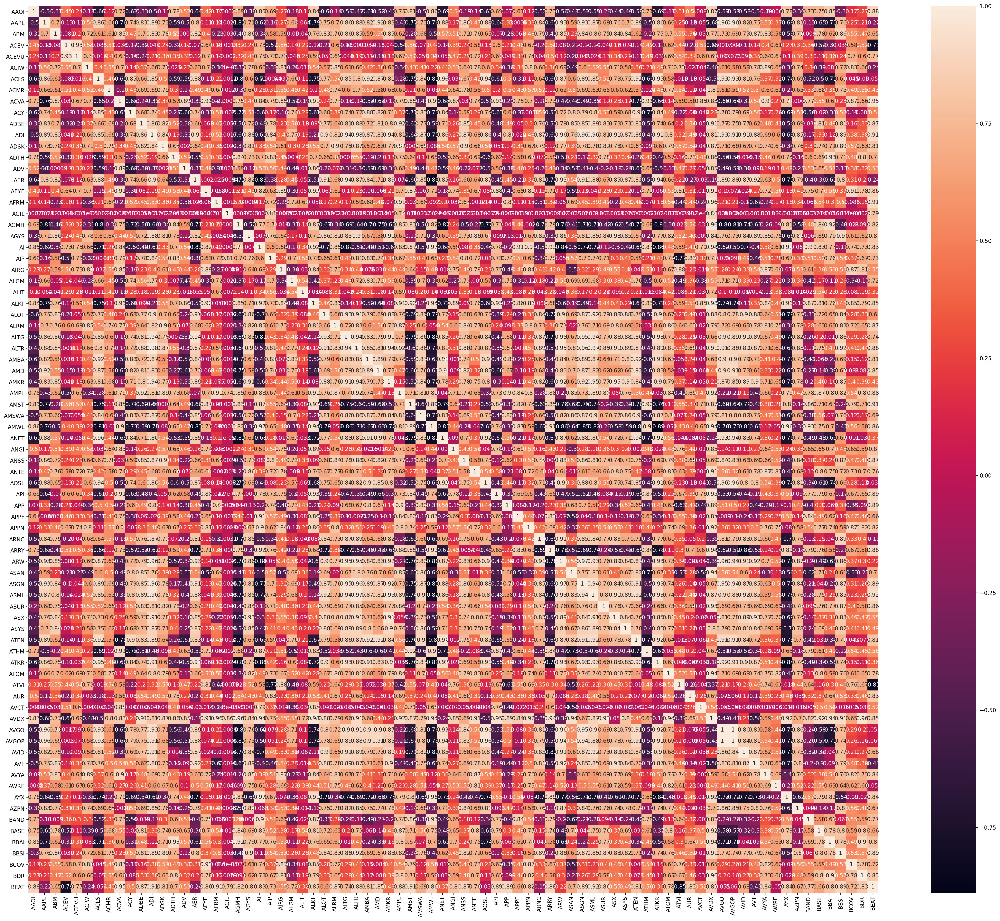

In [274]:
figure(figsize=(35, 30), dpi=200)
sn.heatmap(corr_matrix, annot = True)

In [108]:

ALTR = minTick_data['ALTR'] # S&P 500
ADI = minTick_data['ADI'] # Berkshire Class A share


In [77]:
fee = 0.001
window = 252
threshod = 1
for t in range(window, len(data)):
    returns.iloc[t-252:t].std()
    


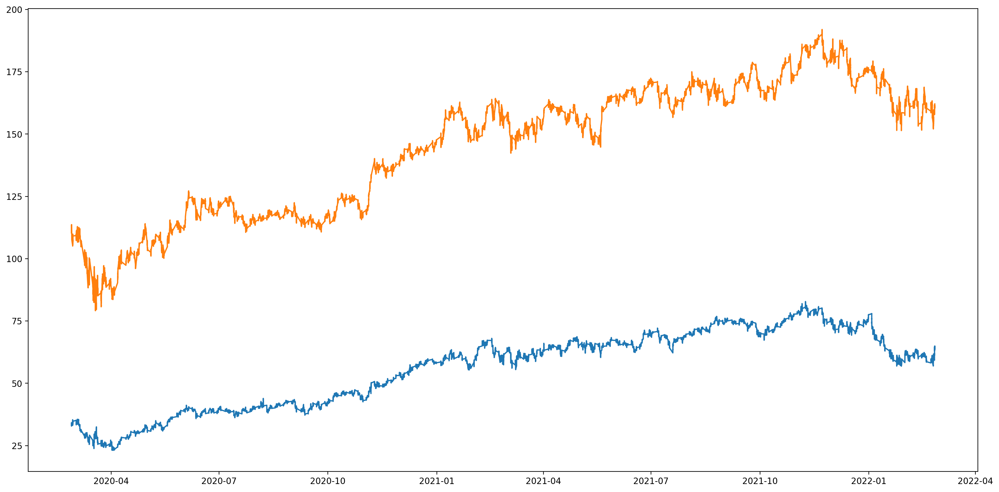

In [173]:
figure(figsize=(20, 10), dpi=200)
plt.plot(ALTR, label = "ALTR")
plt.plot(ADI, label = "ADI")



Text(0.5, 1.0, 'Spread between NIKE and AAPL')

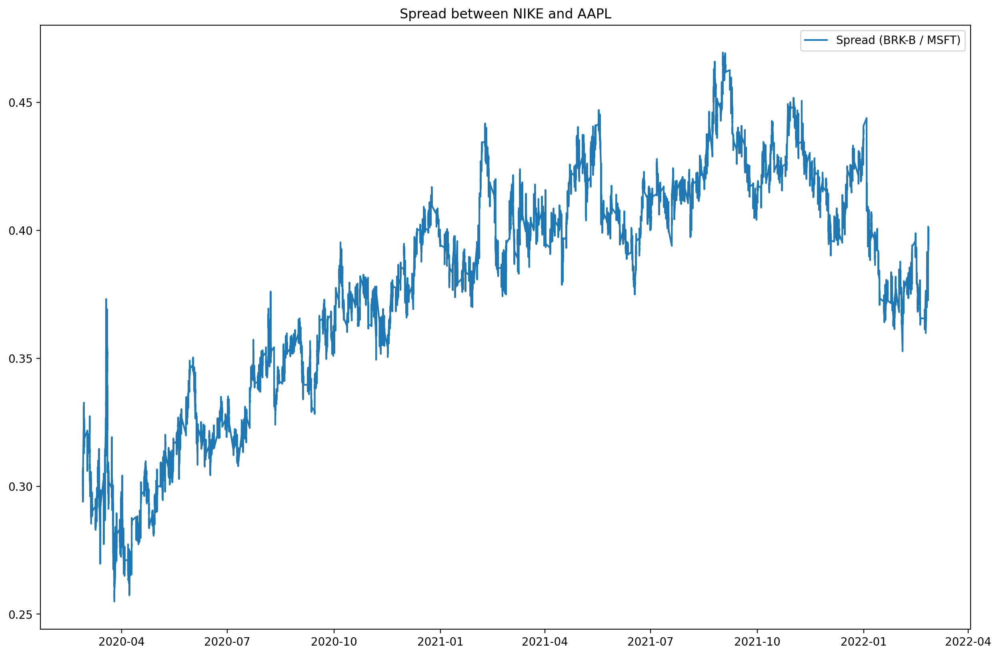

In [176]:
# plot the spread
figure(figsize=(15, 10), dpi=200)
plt.plot(ALTR / ADI, label = 'Spread (BRK-B / MSFT)')
plt.legend()
plt.title("Spread between NIKE and AAPL")

In [127]:
# Check out the cointegration value: Null hyp. = no cointegration
import statsmodels.tsa.stattools as ts 
result = ts.coint(ALTR, ADI)
result

(-5.594273643242826,
 1.1546556210599054e-05,
 array([-3.89649576, -3.33616111, -3.04447159]))

In [128]:
# Cointegration test: A technique used to find a potential correlation in a time series (long term)
# Determines if the spread between the two assets are constant over time.
# Null Hypothesis: Spread between series are non-stationary.
# Uses the augmented Engle-Granger two-step cointegration test.
cointegration_t_statistic = result[0]
p_val = result[1]
critical_values_test_statistic_at_1_5_10 = result[2]
print('We want the P val < 0.05 (meaning that cointegration exists)')
print('P value for the augmented Engle-Granger two-step cointegration test is', p_val)


We want the P val < 0.05 (meaning that cointegration exists)
P value for the augmented Engle-Granger two-step cointegration test is 1.1546556210599054e-05


In [130]:
from statsmodels.tsa.stattools import adfuller
# Compute the ADF test for Altair Engineering and Microsoft
# With all time series, you want to have stationary data otherwise our data will be very hard to predict.
# ADF for Berkshire Hathaway Class B
ALTR_ADF = adfuller(ALTR)
print('P value for the Augmented Dickey-Fuller Test is', ALTR_ADF[1])
ADI_ADF = adfuller(ADI)
print('P value for the Augmented Dickey-Fuller Test is', ADI_ADF[1])
Spread_ADF = adfuller(ALTR - ADI)
print('P value for the Augmented Dickey-Fuller Test is', Spread_ADF[1])
Ratio_ADF = adfuller(ALTR / ADI)
print('P value for the Augmented Dickey-Fuller Test is', Ratio_ADF[1])
# Spread looks fine. If you'd want even better results, consider taking the difference (order 1) of Berkshire and MSFT

# Results: can only claim stationary for the spread (since P value < 0.05). This suggests a constant mean over time.
# Therefore, the two series are cointegrated.

P value for the Augmented Dickey-Fuller Test is 0.5584070046002765
P value for the Augmented Dickey-Fuller Test is 0.5612794975238714
P value for the Augmented Dickey-Fuller Test is 0.15241834814995503
P value for the Augmented Dickey-Fuller Test is 0.12164083451974023


Text(0.5, 1.0, 'Price Ratio between BRK and MSFT')

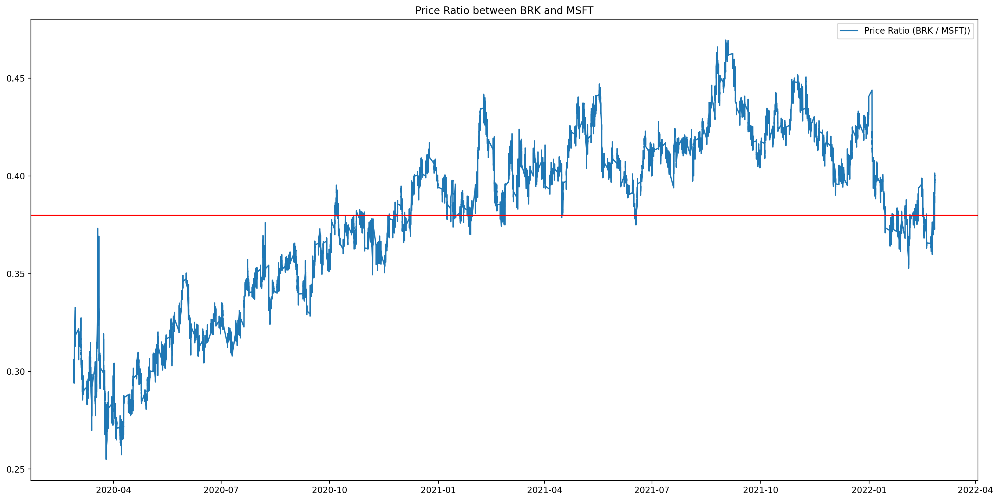

In [141]:
# Also, we can take a look at the price ratios between the two time series.
figure(figsize=(20, 10), dpi=200)
ratio = ALTR / ADI
plt.plot(ratio, label = 'Price Ratio (BRK / MSFT))')
plt.axhline(ratio.mean(), color='red')
plt.legend()
plt.title("Price Ratio between BRK and MSFT")

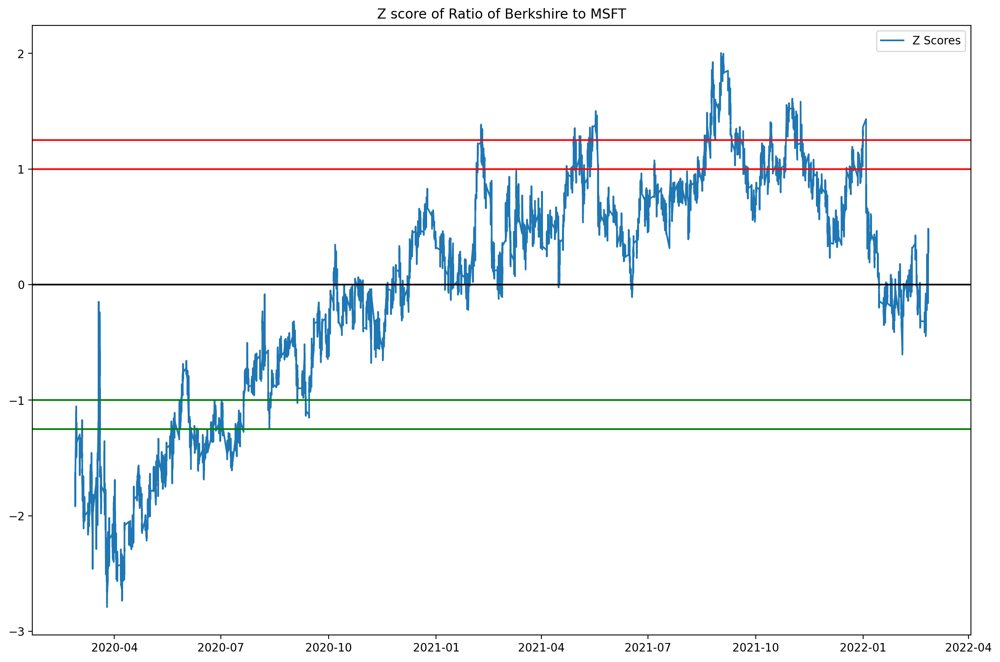

In [140]:
# NOTE, here you can either use the spread OR the Price ratio approach. Anyways, let's standardize the ratio so we can have a 
# upper and lower bound to help evaluate our trends.. Let's stick with the ratio data.
figure(figsize=(15, 10), dpi=200)
# Calculate the Zscores of each row.
df_zscore = (ratio - ratio.mean())/ratio.std()
plt.plot(df_zscore, label = "Z Scores")
plt.axhline(df_zscore.mean(), color = 'black')
plt.axhline(1.0, color='red') # Setting the upper and lower bounds to be the z score of 1 and -1 (1/-1 standard deviation)
plt.axhline(1.25, color='red') # 95% of our data will lie between these bounds.
plt.axhline(-1.0, color='green') # 68% of our data will lie between these bounds.
plt.axhline(-1.25, color='green') # 95% of our data will lie between these bounds.
plt.legend(loc = 'best')
plt.title('Z score of Ratio of Berkshire to MSFT')
plt.show()
# For the most part, the range that exists outside of these 'bands' must come converge back to the mean. Thus, you can 
# determine when you can go long or short the pair (BRK_B to MSFT).

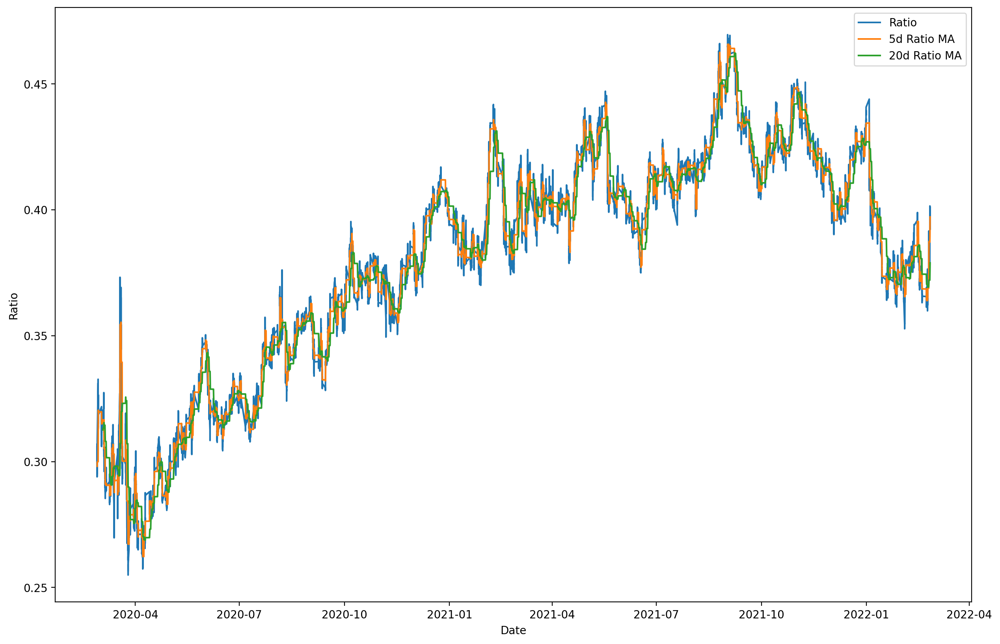

In [156]:
figure(figsize=(15, 10), dpi=200)
ratios_mavg5 = ratio.rolling(window=300, center=False).mean()
ratios_mavg20 = ratio.rolling(window=1500, center=False).mean()
std_20 = ratio.rolling(window=1500, center=False).std()
zscore_20_5 = (ratios_mavg5 - ratios_mavg20)/std_20
plt.plot(ratio.index, ratio.values)
plt.plot(ratios_mavg5.index, ratios_mavg5.values)
plt.plot(ratios_mavg20.index, ratios_mavg20.values)
plt.legend(['Ratio', '5d Ratio MA', '20d Ratio MA'])
plt.xlabel('Date')
plt.ylabel('Ratio')
plt.show()

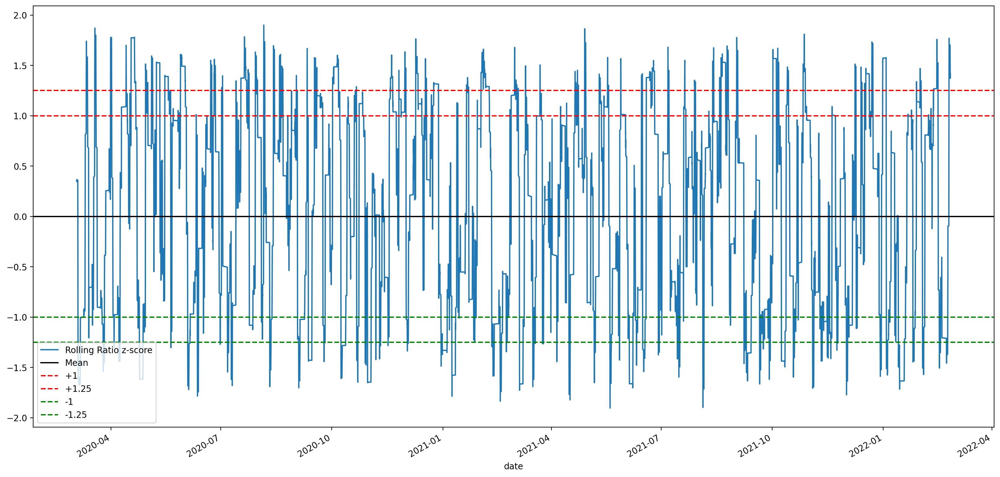

In [160]:
figure(figsize=(20, 10), dpi=200)
zscore_20_5.plot()
plt.axhline(0, color='black')
plt.axhline(1, color='red', linestyle='--')
plt.axhline(1.25, color='red', linestyle='--')
plt.axhline(-1, color='green', linestyle='--')
plt.axhline(-1.25, color='green', linestyle='--')
plt.legend(['Rolling Ratio z-score', 'Mean', '+1','+1.25','-1','-1.25'])
plt.show()

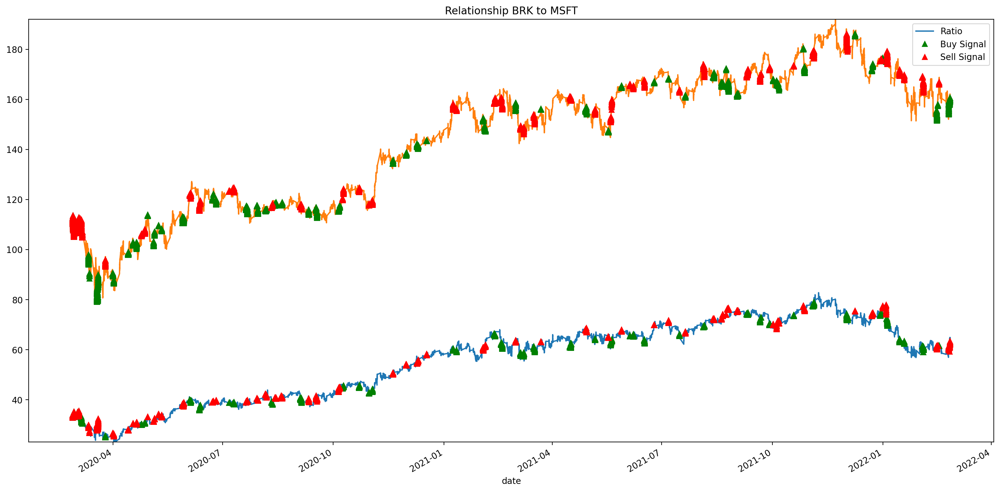

In [169]:
figure(figsize=(20, 10), dpi=200)
ALTR.plot()
buy = ALTR.copy()
sell = ALTR.copy()
buy[zscore_20_5>-1.5] = 0
sell[zscore_20_5<1.5] = 0
buy.plot(color='g', linestyle='None', marker='^')
sell.plot(color='r', linestyle='None', marker='^')

ADI.plot()
buy = ADI.copy()
sell = ADI.copy()
buy[zscore_20_5<1.5] = 0
sell[zscore_20_5>-1.5] = 0
buy.plot(color='g', linestyle='None', marker='^')
sell.plot(color='r', linestyle='None', marker='^')

x1, x2, y1, y2 = plt.axis()
plt.axis((x1, x2, ALTR.min(), ADI.max()))
plt.legend(['Ratio', 'Buy Signal', 'Sell Signal'])
plt.title('Relationship BRK to MSFT')
plt.show()